**The third section of this project is all about rainfall data. As is customary, I placed all my imports here.**

In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import calendar
import plotly.graph_objects as go
from scipy.stats import gaussian_kde
from datetime import datetime

**I loaded the dataset that I obtained from the Humanitarian Data Exchange. This dataset is incredibly detailed and expansive, containing 10-day rainfall records all the way from 1981!**

In [6]:
rainfall = pd.read_csv('/Users/jmtee/Desktop/Dengue project/PH Rainfall 1981-2025.csv', low_memory=False)
rainfall.head()

,date,adm2_id,ADM2_PCODE,n_pixels,rfh,rfh_avg,r1h,r1h_avg,r3h,r3h_avg,rfq,r1q,r3q,version
0,#date,#adm2+id,#adm2+code,#indicator+n_pixels+num,#indicator+rfh+num,#indicator+rfh_avg+num,#indicator+r1h+num,#indicator+r1h_avg+num,#indicator+r3h+num,#indicator+r3h_avg+num,#indicator+rfq+pct,#indicator+r1q+pct,#indicator+r3q+pct,#status
1,1981-01-01,1007626,PH036900000,106.0,0.6604,0.8579,NaN,NaN,NaN,NaN,96.6287,NaN,NaN,final
2,1981-01-11,1007626,PH036900000,106.0,0.2642,0.5509,NaN,NaN,NaN,NaN,94.8334,NaN,NaN,final
3,1981-01-21,1007626,PH036900000,106.0,1.0,0.8245,1.9245,2.2333,NaN,NaN,103.0126,97.4757,NaN,final
4,1981-02-01,1007626,PH036900000,106.0,0.9717,2.5204,2.2358,3.8959,NaN,NaN,79.4062,88.0536,NaN,final


**After a quick view, I immediately removed irrelevant rows and columns and proceeded with the regular dataset scans.**

In [8]:
rainfall = rainfall.drop(index=0)
rainfall = rainfall.drop('version', axis=1) 
rainfall.head()

,date,adm2_id,ADM2_PCODE,n_pixels,rfh,rfh_avg,r1h,r1h_avg,r3h,r3h_avg,rfq,r1q,r3q
1,1981-01-01,1007626,PH036900000,106.0,0.6604,0.8579,NaN,NaN,NaN,NaN,96.6287,NaN,NaN
2,1981-01-11,1007626,PH036900000,106.0,0.2642,0.5509,NaN,NaN,NaN,NaN,94.8334,NaN,NaN
3,1981-01-21,1007626,PH036900000,106.0,1.0,0.8245,1.9245,2.2333,NaN,NaN,103.0126,97.4757,NaN
4,1981-02-01,1007626,PH036900000,106.0,0.9717,2.5204,2.2358,3.8959,NaN,NaN,79.4062,88.0536,NaN
5,1981-02-11,1007626,PH036900000,106.0,1.5377,3.6289,3.5094,6.9739,NaN,NaN,75.7653,79.5895,NaN


In [9]:
rainfall.info()
rainfall.isnull().sum()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 129762 entries, 1 to 129762
Data columns (total 13 columns):
 #   Column      Non-Null Count   Dtype 
---  ------      --------------   ----- 
 0   date        129762 non-null  object
 1   adm2_id     129762 non-null  object
 2   ADM2_PCODE  129762 non-null  object
 3   n_pixels    129762 non-null  object
 4   rfh         129762 non-null  object
 5   rfh_avg     129762 non-null  object
 6   r1h         129600 non-null  object
 7   r1h_avg     129600 non-null  object
 8   r3h         129114 non-null  object
 9   r3h_avg     129114 non-null  object
 10  rfq         129762 non-null  object
 11  r1q         129600 non-null  object
 12  r3q         129114 non-null  object
dtypes: object(13)
memory usage: 12.9+ MB


date            0
adm2_id         0
ADM2_PCODE      0
n_pixels        0
rfh             0
rfh_avg         0
r1h           162
r1h_avg       162
r3h           648
r3h_avg       648
rfq             0
r1q           162
r3q           648
dtype: int64

In [10]:
rainfall_columns = ["n_pixels", "rfh", "rfh_avg", "r1h", "r1h_avg",
                    "r3h", "r3h_avg", "rfq", "r1q", "r3q"]

for col in rainfall_columns:
    rainfall[col] = pd.to_numeric(rainfall[col], errors = "coerce")

rainfall.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 129762 entries, 1 to 129762
Data columns (total 13 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   date        129762 non-null  object 
 1   adm2_id     129762 non-null  object 
 2   ADM2_PCODE  129762 non-null  object 
 3   n_pixels    129762 non-null  float64
 4   rfh         129762 non-null  float64
 5   rfh_avg     129762 non-null  float64
 6   r1h         129600 non-null  float64
 7   r1h_avg     129600 non-null  float64
 8   r3h         129114 non-null  float64
 9   r3h_avg     129114 non-null  float64
 10  rfq         129762 non-null  float64
 11  r1q         129600 non-null  float64
 12  r3q         129114 non-null  float64
dtypes: float64(10), object(3)
memory usage: 12.9+ MB


In [11]:
rainfall["date"] = pd.to_datetime(rainfall["date"])
rainfall["Year"] = rainfall["date"].dt.year
rainfall["Month"] = rainfall["date"].dt.month
rainfall.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 129762 entries, 1 to 129762
Data columns (total 15 columns):
 #   Column      Non-Null Count   Dtype         
---  ------      --------------   -----         
 0   date        129762 non-null  datetime64[ns]
 1   adm2_id     129762 non-null  object        
 2   ADM2_PCODE  129762 non-null  object        
 3   n_pixels    129762 non-null  float64       
 4   rfh         129762 non-null  float64       
 5   rfh_avg     129762 non-null  float64       
 6   r1h         129600 non-null  float64       
 7   r1h_avg     129600 non-null  float64       
 8   r3h         129114 non-null  float64       
 9   r3h_avg     129114 non-null  float64       
 10  rfq         129762 non-null  float64       
 11  r1q         129600 non-null  float64       
 12  r3q         129114 non-null  float64       
 13  Year        129762 non-null  int32         
 14  Month       129762 non-null  int32         
dtypes: datetime64[ns](1), float64(10), int32(2), object

**The dataset initially consisted entirely of object data types. I summarily converted all rainfall measurements to numeric, the date column into datetime, and from there, extracted the year and month. A key hurdle for this preprocessing was decoding the ADM2_PCODE values, which initially appeared ambiguous. At first, I had no idea that these were location identifiers. Fortunately, I was able to quickly find a reference resource that mapped these codes to their corresponding province names.**

In [13]:
rainfall['ADM2_PCODE'].unique()

array(['PH036900000', 'PH166800000', 'PH141100000', 'PH071200000',
       'PH101300000', 'PH031400000', 'PH021500000', 'PH157000000',
       'PH051600000', 'PH087800000', 'PH037100000', 'PH054100000',
       'PH098300000', 'PH140100000', 'PH160200000', 'PH160300000',
       'PH060400000', 'PH050500000', 'PH060600000', 'PH148100000',
       'PH037700000', 'PH150700000', 'PH030800000', 'PH020900000',
       'PH041000000', 'PH051700000', 'PH097300000', 'PH101800000',
       'PH097200000', 'PH052000000', 'PH156600000', 'PH126500000',
       'PH086400000', 'PH126300000', 'PH056200000', 'PH076100000',
       'PH086000000', 'PH175900000', 'PH045800000', 'PH061900000',
       'PH025700000', 'PH045600000', 'PH015500000', 'PH035400000',
       'PH064500000', 'PH074600000', 'PH124700000', 'PH084800000',
       'PH034900000', 'PH025000000', 'PH175100000', 'PH175200000',
       'PH175300000', 'PH166700000', 'PH153800000', 'PH128000000',
       'PH104300000', 'PH012900000', 'PH012800000', 'PH1444000

In [14]:
province_codes = {"PH036900000":"Tarlac", "PH166800000":"Surigao Del Sur", "PH141100000":"Benguet", "PH071200000":"Bohol",
                  "PH101300000":"Bukidnon", "PH031400000":"Bulacan", "PH021500000":"Cagayan", "PH157000000":"Tawi-Tawi",
                  "PH051600000":"Camarines Norte", "PH087800000":"Biliran", "PH037100000":"Zambales", "PH054100000":"Masbate",
                  "PH098300000":"Zamboanga Sibugay", "PH140100000":"Abra", "PH160200000":"Agusan Del Norte", "PH160300000":"Agusan Del Sur",
                  "PH060400000":"Aklan", "PH050500000":"Albay", "PH060600000":"Antique", "PH148100000":"Apayao",
                  "PH037700000":"Aurora", "PH150700000":"Basilan", "PH030800000":"Bataan", "PH020900000":"Batanes",
                  "PH041000000":"Batangas", "PH051700000":"Camarines Sur", "PH097300000":"Zamboanga Del Sur", "PH101800000":"Camiguin",
                  "PH097200000":"Zamboanga Del Norte", "PH052000000":"Catanduanes", "PH156600000":"Sulu", "PH126500000":"Sultan Kudarat",
                  "PH086400000":"Southern Leyte", "PH126300000":"South Cotabato", "PH056200000":"Sorsogon", "PH076100000":"Siquijor",
                  "PH086000000":"Samar", "PH175900000":"Romblon", "PH045800000":"Rizal", "PH061900000":"Capiz",
                  "PH025700000":"Quirino", "PH045600000":"Quezon", "PH015500000":"Pangasinan", "PH035400000":"Pampanga",
                  "PH064500000":"Negros Occidental", "PH074600000":"Negros Oriental", "PH124700000":"Cotabato", "PH084800000":"Northern Samar",
                  "PH034900000":"Nueva Ecija", "PH025000000":"Nueva Vizcaya", "PH175100000":"Occidental Mindoro", "PH175200000":"Oriental Mindoro",
                  "PH175300000":"Palawan", "PH166700000":"Surigao Del Norte", "PH153800000":"Maguindanao", "PH128000000":"Sarangani",
                  "PH104300000":"Misamis Oriental", "PH012900000":"Ilocos Sur", "PH012800000":"Ilocos Norte", "PH144400000":"Mountain Province",
                  "PH142700000":"Ifugao", "PH023100000":"Isabela", "PH067900000":"Guimaras", "PH082600000":"Eastern Samar",
                  "PH168500000":"Dinagat Islands", "PH112500000":"Davao Oriental", "PH112400000":"Davao Del Sur", "PH112300000":"Davao Del Norte",
                  "PH063000000":"Iloilo", "PH118200000":"Davao De Oro", "PH042100000":"Cavite", "PH143200000":"Kalinga",
                  "PH013300000":"La Union", "PH043400000":"Laguna", "PH103500000":"Lanao Del Norte", "PH153600000":"Lanao Del Sur",
                  "PH083700000":"Leyte", "PH174000000":"Marinduque", "PH137400000":"NCR", "PH104200000":"Misamis Occidental", "PH072200000":"Cebu"}
rainfall["Province"] = rainfall["ADM2_PCODE"].map(province_codes)
rainfall['Province'].unique()

array(['Tarlac', 'Surigao Del Sur', 'Benguet', 'Bohol', 'Bukidnon',
       'Bulacan', 'Cagayan', 'Tawi-Tawi', 'Camarines Norte', 'Biliran',
       'Zambales', 'Masbate', 'Zamboanga Sibugay', 'Abra',
       'Agusan Del Norte', 'Agusan Del Sur', 'Aklan', 'Albay', 'Antique',
       'Apayao', 'Aurora', 'Basilan', 'Bataan', 'Batanes', 'Batangas',
       'Camarines Sur', 'Zamboanga Del Sur', 'Camiguin',
       'Zamboanga Del Norte', 'Catanduanes', 'Sulu', 'Sultan Kudarat',
       'Southern Leyte', 'South Cotabato', 'Sorsogon', 'Siquijor',
       'Samar', 'Romblon', 'Rizal', 'Capiz', 'Quirino', 'Quezon',
       'Pangasinan', 'Pampanga', 'Negros Occidental', 'Negros Oriental',
       'Cotabato', 'Northern Samar', 'Nueva Ecija', 'Nueva Vizcaya',
       'Occidental Mindoro', 'Oriental Mindoro', 'Palawan',
       'Surigao Del Norte', 'Maguindanao', 'Sarangani',
       'Misamis Oriental', 'Ilocos Sur', 'Ilocos Norte',
       'Mountain Province', 'Ifugao', 'Isabela', 'Guimaras',
       'Eastern Sam

In [15]:
rainfall["Province"].isnull().sum()

0

In [16]:
unmapped_codes = rainfall.loc[rainfall["Province"].isnull(), "ADM2_PCODE"].unique()
unmapped_codes

array([], dtype=object)

In [17]:
rainfall.drop(columns=["adm2_id", "ADM2_PCODE"], inplace=True)
rainfall.head()

,date,n_pixels,rfh,rfh_avg,r1h,r1h_avg,r3h,r3h_avg,rfq,r1q,r3q,Year,Month,Province
1,1981-01-01,106.0,0.6604,0.8579,NaN,NaN,NaN,NaN,96.6287,NaN,NaN,1981,1,Tarlac
2,1981-01-11,106.0,0.2642,0.5509,NaN,NaN,NaN,NaN,94.8334,NaN,NaN,1981,1,Tarlac
3,1981-01-21,106.0,1.0000,0.8245,1.9245,2.2333,NaN,NaN,103.0126,97.4757,NaN,1981,1,Tarlac
4,1981-02-01,106.0,0.9717,2.5204,2.2358,3.8959,NaN,NaN,79.4062,88.0536,NaN,1981,2,Tarlac
5,1981-02-11,106.0,1.5377,3.6289,3.5094,6.9739,NaN,NaN,75.7653,79.5895,NaN,1981,2,Tarlac


**After mapping the province names, I discarded both of the original code columns to keep the dataframe concise. Recall earlier that I had scanned the dataset and identified several columns with hundreds of null values. These missing values are from rolling aggregations and moving averages (e.g., 1-month or 3-month indicators) that require prior time periods to compute. These are data that are naturally unavailable at the beginning of the time series for each province.**

**Fortunately though, my analysis does not require these data as I decided to focus on rainfall totals (rfh) and their anomalies (r1q), which measure deviations from typical values. These two variables have no null values hence, I can proceed without issues. That said, I chose not to discard the other columns yet, as they may be useful in future analyses.**

In [19]:
rainfall.describe()

,date,n_pixels,rfh,rfh_avg,r1h,r1h_avg,r3h,r3h_avg,rfq,r1q,r3q,Year,Month
count,129762,129762.000000,129762.000000,129762.000000,129600.000000,129600.000000,129114.000000,129114.000000,129762.000000,129600.000000,129114.000000,129762.000000,129762.000000
mean,2003-03-27 12:32:21.573033600,120.617284,75.481208,76.289291,226.409724,228.866771,679.514553,687.121192,99.433274,99.086704,98.952868,2002.752809,6.466292
min,1981-01-01 00:00:00,7.000000,0.000000,0.000000,0.130100,0.779400,3.282600,7.547800,4.740300,4.915500,12.677700,1981.000000,1.000000
25%,1992-02-11 00:00:00,63.000000,23.240700,43.600000,98.553075,133.879300,373.080000,435.241800,54.746025,67.380275,75.788400,1992.000000,3.000000
50%,2003-03-26 12:00:00,106.000000,58.014350,72.110700,200.185200,218.904800,638.110500,662.561800,85.580350,93.000850,96.475650,2003.000000,6.000000
75%,2014-05-11 00:00:00,161.000000,105.235325,101.185600,311.505075,301.496800,911.453225,901.101900,126.725275,122.309125,118.117425,2014.000000,9.000000
max,2025-06-21 00:00:00,481.000000,1140.304300,289.706800,2016.500000,824.952300,3243.847800,1968.305100,827.957900,678.962100,537.167400,2025.000000,12.000000
std,NaN,82.689767,70.352763,46.001287,169.496674,132.761264,415.455013,352.690175,65.224374,46.393546,36.080174,12.847714,3.451901


In [20]:
rainfall = (rainfall.groupby(["Province", "Year", "Month"]).agg({"rfh": "sum", "r1q": "mean"}).reset_index())
rainfall.head()

,Province,Year,Month,rfh,r1q
0,Abra,1981,1,22.4327,128.757700
1,Abra,1981,2,7.2015,79.807433
2,Abra,1981,3,21.2836,76.409567
3,Abra,1981,4,69.5373,67.606533
4,Abra,1981,5,721.9626,235.226367


**The working dataframe, now named "rainfall", contains only the key variables, monthly-aggregated rfh and r1q, along with location and time data. The first visual is a simple time series chart of the average annual rainfall across all provinces. Since rainfall is not bound by geographical or administrative borders, the values simply represent the amount of rainfall one would experience wherever he/she is in the country during a given year. More than 40 years worth of data tells us that a typical province receives more than 150 mm of rain annually, even during so-called El Niño periods. Notably, in each of the past six years — and 19 of the last 21 years— the average annual rainfall has exceeded 200 mm.**

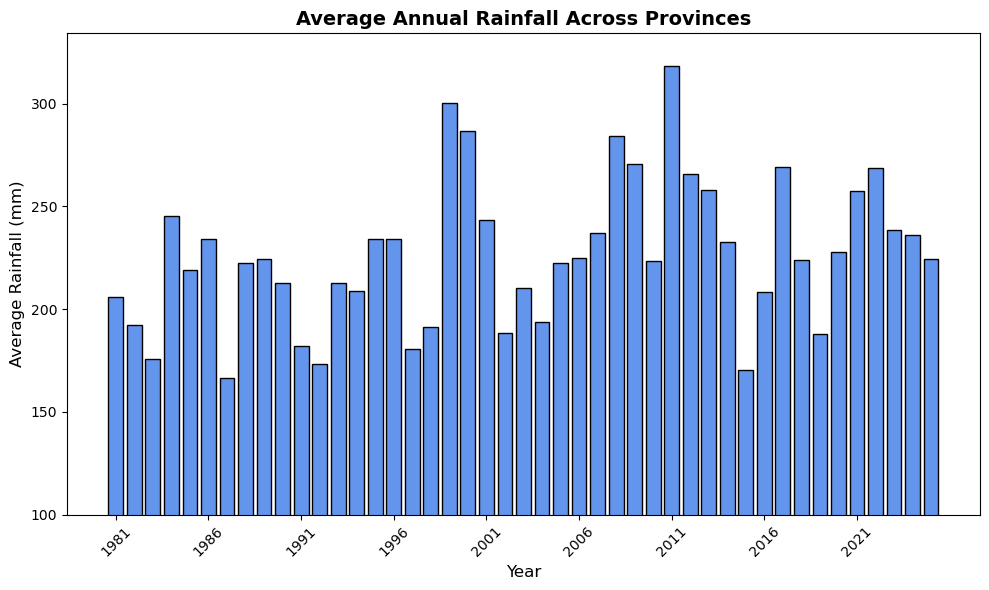

In [22]:
average_annual_rainfall = rainfall.groupby('Year')['rfh'].mean().reset_index()

plt.figure(figsize=(10, 6))
plt.bar(average_annual_rainfall['Year'], average_annual_rainfall['rfh'], color='cornflowerblue', edgecolor='black')
plt.title('Average Annual Rainfall Across Provinces', fontsize=14, weight='bold')
plt.xlabel('Year', fontsize=12)
plt.ylabel('Average Rainfall (mm)', fontsize=12)
plt.ylim(bottom=100)
years = average_annual_rainfall['Year']
plt.xticks(ticks=range(years.min(), years.max()+1, 5), rotation=45)
plt.tight_layout()
plt.show()

**Looking at monthly trends across all provinces throughout all years, we can clearly observe the significant increase in rainfall magnitude during the 2nd half of the year, which is considered as the monsoon season in the Philippines. Interestingly, a typical province still receives more than 100 mm of rain even during summer months.**

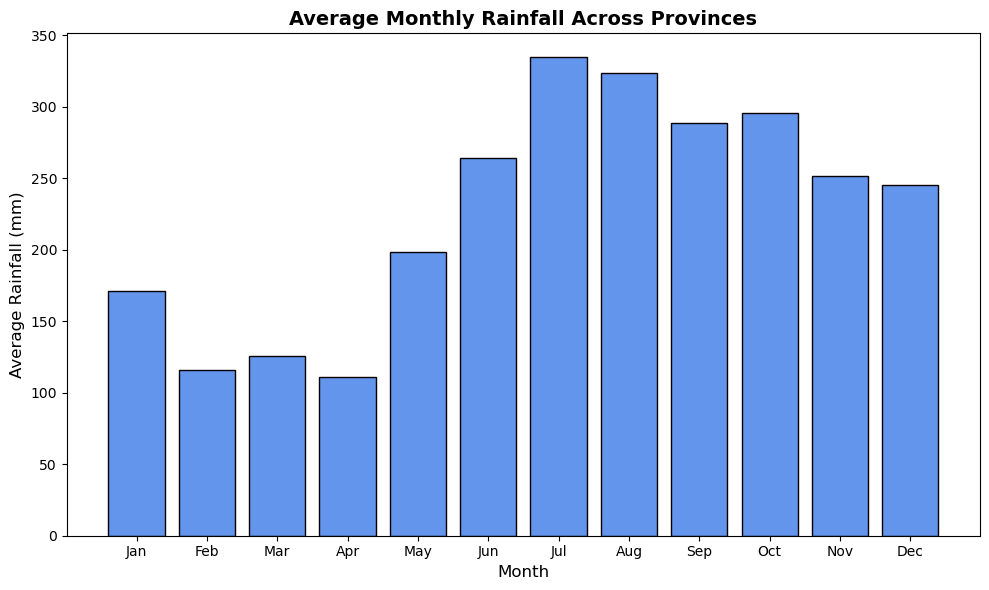

In [24]:
average_monthly_rainfall = rainfall.groupby('Month')['rfh'].mean().reset_index()

plt.figure(figsize=(10, 6))
plt.bar(average_monthly_rainfall['Month'], average_monthly_rainfall['rfh'], color='cornflowerblue', edgecolor='black')
plt.title('Average Monthly Rainfall Across Provinces', fontsize=14, weight='bold')
plt.xlabel('Month', fontsize=12)
plt.ylabel('Average Rainfall (mm)', fontsize=12)
plt.xticks(ticks=range(1, 13),labels=[calendar.month_abbr[m] for m in range(1, 13)])
plt.tight_layout()
plt.show()

**I sampled data for NCR, plotting its monthly rainfall totals for the last 10 years. The chart shows that while the actual totals vary quite a bit from year to year, there is still a consistent seasonal pattern that we can observe. Rainfall in the capital begins to ramp up by late May, peaks during June to September, and then gradually tapers off until December, when there may still be occasional bursts of strong rain.** 

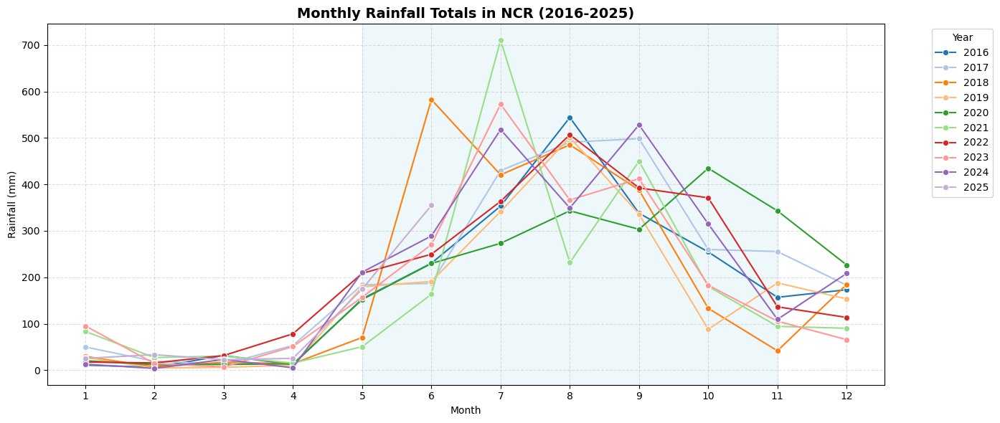

In [26]:
ncr_totals = rainfall.query("Province == 'NCR' and Year >= 2016")

plt.figure(figsize=(14, 6))
sns.lineplot(data=ncr_totals, x="Month", y="rfh", hue="Year", palette="tab20", marker="o")
plt.title("Monthly Rainfall Totals in NCR (2016-2025)", fontsize=14, weight="bold")
plt.ylabel("Rainfall (mm)")
plt.xlabel("Month")
plt.xticks(range(1, 13))
plt.legend(title="Year", bbox_to_anchor=(1.05, 1), loc="upper left")
plt.grid(True, linestyle="--", alpha=0.4)
plt.axvspan(5, 11, color='lightblue', alpha=0.2)
plt.tight_layout()
plt.show()

**Plotting the rainfall anomaly values for NCR, we can observe the inverse trend yet it reinforces the same interpretation. The chart shows that rainfall values around June to September normally align with established long-term climatological norms, indicating a relatively stable behavior over time during these months. In constrast, we can observe more pronounced deviations outside this monsoon window, particularly during March and April when rainfall is typically not expected. Interesting to point out are the anomaly spikes during January, which tells us that the occurrence and intensity of rainfall during this month was practically unpredictable during the last 10 years. This may be a reflection of the tail-end effects of an increasingly erratic monsoon season or a broader shift in atmospheric and oceanic dynamics, especially in the Pacific Ocean, potentially linked to climate change.**

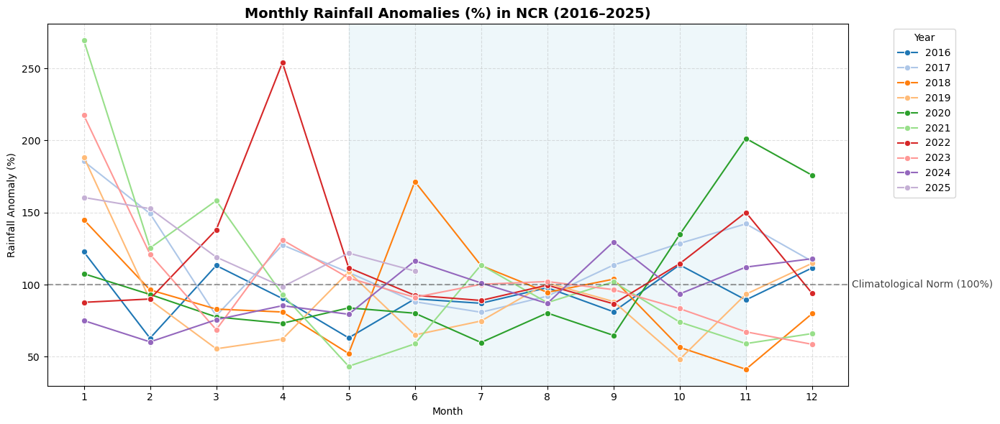

In [28]:
ncr_anomaly = rainfall.query("Province == 'NCR' and Year >= 2016")

plt.figure(figsize=(14, 6))
sns.lineplot(data=ncr_anomaly, x="Month", y="r1q", hue="Year", palette="tab20", marker="o")
plt.title("Monthly Rainfall Anomalies (%) in NCR (2016–2025)", fontsize=14, weight="bold")
plt.ylabel("Rainfall Anomaly (%)")
plt.xlabel("Month")
plt.xticks(range(1, 13))
plt.legend(title="Year", bbox_to_anchor=(1.05, 1), loc="upper left")
plt.grid(True, linestyle="--", alpha=0.4)
plt.axvspan(5, 11, color='lightblue', alpha=0.2)
plt.axhline(100, color="#444444", linestyle="--", linewidth=1.5, alpha=0.5)
plt.text(12.6, 98, "Climatological Norm (100%)", fontsize=10, color="#444444")
plt.tight_layout()
plt.show()

**I replicated the same analysis with two other highly urbanized provinces - Cebu and Davao Del Sur - and plotted the data along with NCR. The resulting chart looks crowded but it highlights important pattern variations between provinces and may also demonstrate regional patterns in the southern part of the Philippines where rainfall may be less intense but may be more persistent throughout the year. For example, the plot for Davao Del Sur exhibits a relatively more flat trend, with monthly rainfall never exceeding 400 mm yet frequently receiving more than 150 mm of rainfall during February to April.**

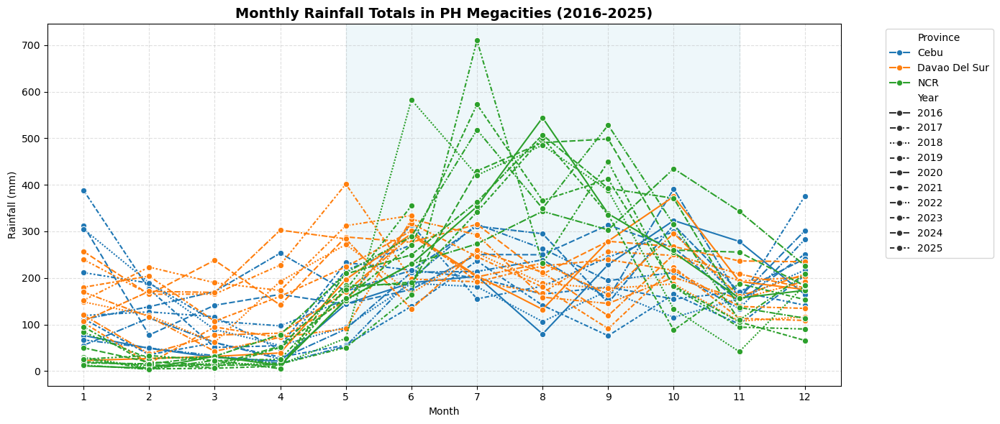

In [30]:
megapolis = ["NCR", "Cebu", "Davao Del Sur"] #change province names if you want
urban_grouped = rainfall[rainfall["Province"].isin(megapolis) & (rainfall["Year"] >= 2016)]

plt.figure(figsize=(14, 6))
sns.lineplot(data=urban_grouped, x="Month", y="rfh", style="Year", hue="Province", marker="o", dashes=True)
plt.title("Monthly Rainfall Totals in PH Megacities (2016-2025)", fontsize=14, weight="bold")
plt.ylabel("Rainfall (mm)")
plt.xlabel("Month")
plt.xticks(range(1, 13))
plt.legend(bbox_to_anchor=(1.05, 1), loc="upper left")
plt.grid(True, linestyle="--", alpha=0.4)
plt.axvspan(5, 11, color='lightblue', alpha=0.2)
plt.tight_layout()
plt.show()

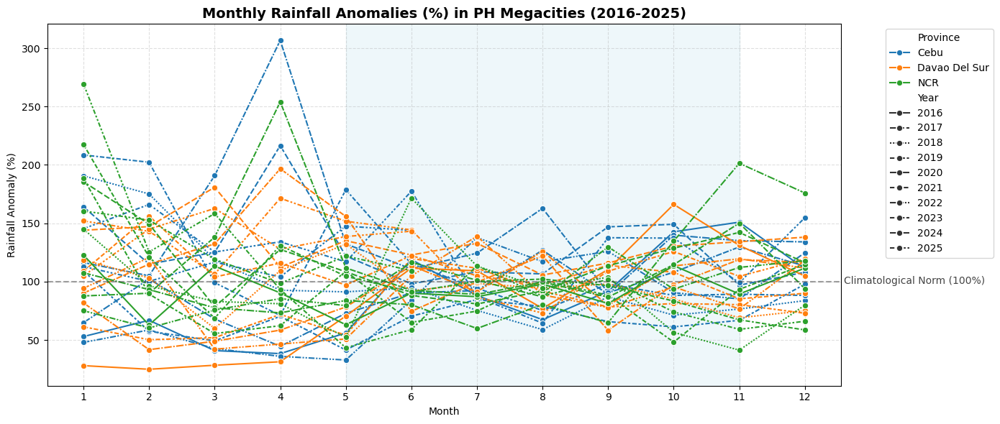

In [31]:
plt.figure(figsize=(14, 6))
sns.lineplot(data=urban_grouped, x="Month", y="r1q", style="Year", hue="Province", marker="o", errorbar=None)
plt.title("Monthly Rainfall Anomalies (%) in PH Megacities (2016-2025)", fontsize=14, weight="bold")
plt.ylabel("Rainfall Anomaly (%)")
plt.xlabel("Month")
plt.xticks(range(1, 13))
plt.legend(bbox_to_anchor=(1.05, 1), loc="upper left")
plt.grid(True, linestyle="--", alpha=0.4)
plt.axvspan(5, 11, color='lightblue', alpha=0.2)
plt.axhline(100, color="#444444", linestyle="--", linewidth=1.5, alpha=0.5)
plt.text(12.6, 98, "Climatological Norm (100%)", fontsize=10, color="#444444")
plt.tight_layout()
plt.show()

**Next, I plotted the distribution of monthly rainfall totals over the past 10 years, and the chart reveals a couple of very compelling insights:**
- **In half of the recorded months, a typical province received less than 208 mm of rain. For comparison, this is lower than what neighboring megacities like Jakarta or Kuala Lumpur regularly experience.**
- **What stands out as particularly eye-opening is the frequency of months with rainfall exceeding 400 mm, especially those surpassing 1000 mm. To put this into perspective, the Amazon Rainforest, one of the wettest places on Earth, where it rains about 200 days a year, averages under 400 mm of rain per month.**

**Visuals like these are a sobering reminder of what it means to live in the most typhoon-affected country in the world.**

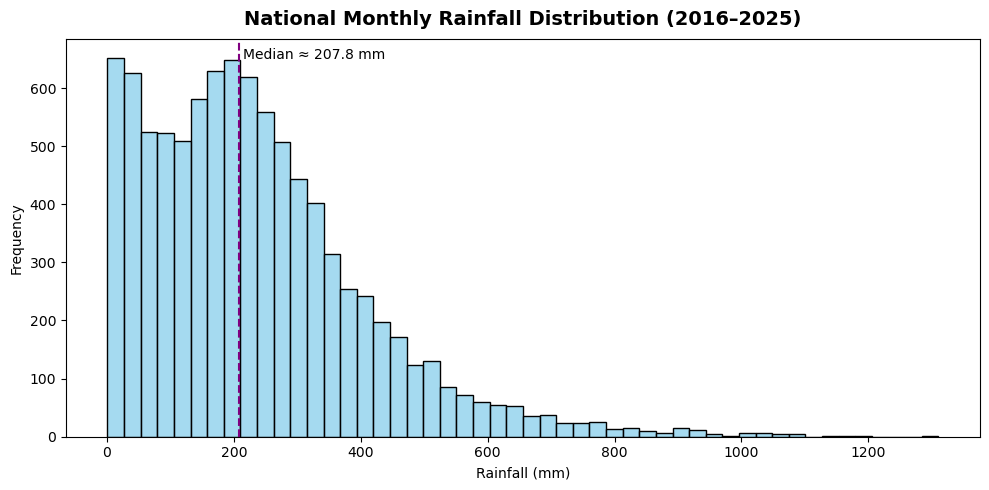

In [33]:
ten_year_rfh = rainfall[rainfall["Year"] >= 2016]["rfh"]
rainfall_median = ten_year_rfh.median()

plt.figure(figsize=(10, 5))
sns.histplot(ten_year_rfh, bins=50, color="skyblue")
plt.axvline(rainfall_median, color="purple", linestyle="--", linewidth=1.5)
plt.text(rainfall_median + 7, plt.ylim()[1]*0.95,
         f"Median ≈ {rainfall_median:.1f} mm",
         color="black", fontsize=10)
plt.title("National Monthly Rainfall Distribution (2016–2025)", fontsize=14, weight="bold", pad=10)
plt.xlabel("Rainfall (mm)")
plt.ylabel("Frequency")
plt.tight_layout()
plt.show()

In [34]:
province_list = sorted(rainfall["Province"].unique())
colors = ["#1f77b4", "#ff7f0e", "#2ca02c", "#d62728", "#9467bd"]

fig = go.Figure()
for i in range(5):
    fig.add_trace(go.Scatter(x=[], y=[], mode="lines", name=f"Province {i+1}", legendgroup=f"group{i}", fill="tozeroy",
                             line=dict(color=colors[i], width=2), opacity=0.4, showlegend=False))

updatemenus = []
for i in range(5):
    buttons = [{"label":"None selected", "method":"restyle",
        "args": [{"x":[[]], "y":[[]], "name":f"Province {i+1}", "showlegend":False}, [i]]}]

    for prov in province_list:
        data = rainfall[(rainfall["Province"] == prov) & (rainfall["Year"] >= 2016)]["rfh"].dropna()

        if len(data) > 1:
            kde = gaussian_kde(data)
            x_vals = np.linspace(0, data.max(), 300)
            y_vals = kde(x_vals)

            buttons.append({"label":prov, "method":"restyle", 
                            "args": [{"x": [x_vals], "y": [y_vals], "name": prov, "line.color": colors[i], "showlegend": True},[i]]})

    updatemenus.append(dict(buttons=buttons, direction="down", showactive=True, x=0.1 + i * 0.18, xanchor="center", y=1.15, yanchor="top", 
                            font=dict(size=11), bgcolor="rgba(255,255,255,0.95)", bordercolor="gray", borderwidth=1, pad={"r": 4, "t": 4}))

fig.update_layout(
    title=dict(text="Rainfall Distribution per Province (Monthly Totals: 2016–2025)", font=dict(size=16, family="Arial Black"), x=0.5, xanchor="center"),
    xaxis_title="Monthly Rainfall (mm)",
    yaxis_title="Density",
    legend_title="Province",
    template="plotly_white",
    hovermode="x unified",
    updatemenus=updatemenus,
    height=600,
    margin=dict(t=180, l=60, r=60, b=60))
fig.show()

**Below are the monthly average rainfall totals for all provinces. We can immediately notice the lightly shaded segment of months - from February to April - which form the traditional summer window. Some provinces, however, still receive a relatively more substantial amount of rainfall even during these months and the vast majority of these provinces are located in the south, i.e from Visayas and Mindanao.**

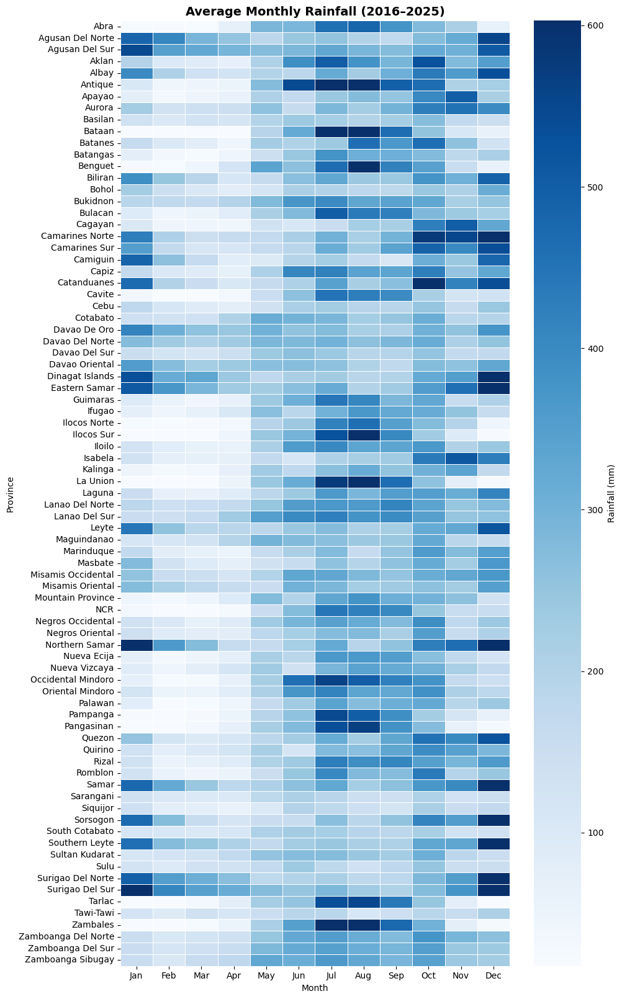

In [36]:
ten_year = rainfall[rainfall["Year"] >= 2016]
pivot = ten_year.pivot_table(index="Province", columns="Month", values="rfh", aggfunc="mean", fill_value=0)

plt.figure(figsize=(10, pivot.shape[0] * 0.2))
sns.heatmap(pivot, cmap="Blues", linewidths=0.4, cbar_kws={"label": "Rainfall (mm)"}, robust=True)
plt.title("Average Monthly Rainfall (2016–2025)", fontsize=14, weight="bold")
plt.ylabel("Province")
plt.xlabel("Month")
month_labels = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']
plt.xticks(ticks=np.arange(12) + 0.5, labels=month_labels)
plt.tight_layout()
plt.show()

**Examining the annual total trends, we can see several dark-shaded cells for a number of provinces: the Agusan provinces, the Surigao provinces, Dinagat Islands, the Samar provinces, and Southern Leyte. These provinces are lined up on the easternmost section of the archipelago. Strikingly, all of them have experienced what can be classified as extreme rainfall for 4-5 years during the last decade. I believe this pattern clearly indicates an urgent need for decisive and immediate action from the concerned local administrations.**

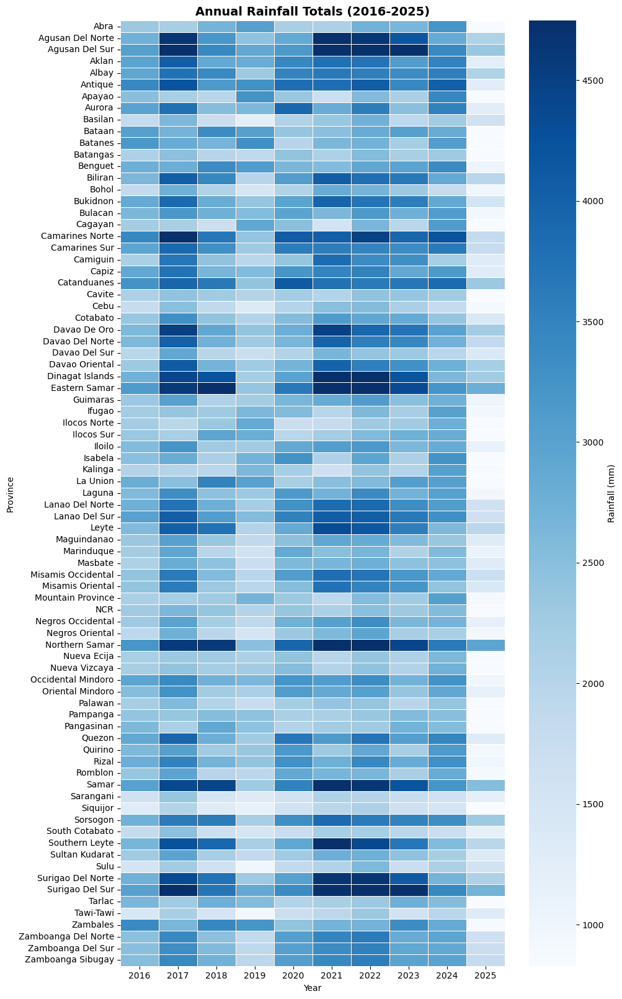

In [38]:
pivot = ten_year.pivot_table(index="Province", columns="Year", values="rfh", aggfunc="sum", fill_value=0)

plt.figure(figsize=(10, pivot.shape[0] * 0.2))
sns.heatmap(pivot, cmap="Blues", linewidths=0.4, cbar_kws={"label": "Rainfall (mm)"}, robust=True)
plt.title("Annual Rainfall Totals (2016-2025)", fontsize=14, weight="bold")
plt.ylabel("Province")
plt.xlabel("Year")
plt.tight_layout()
plt.show()

In [39]:
region_group_map = {
    "Luzon": [
        "Abra", "Apayao", "Aurora", "Bataan", "Batangas", "Benguet", "Bulacan", "Cagayan", "Camarines Norte", "Camarines Sur", "Catanduanes", "Cavite", 
        "Ifugao", "Ilocos Norte", "Ilocos Sur", "Isabela", "Kalinga", "La Union", "Laguna", "Mountain Province", "Nueva Ecija", "Nueva Vizcaya", 
        "Occidental Mindoro", "Oriental Mindoro", "Palawan", "Pampanga", "Pangasinan", "Quezon", "Quirino", "Rizal", "Romblon", "Sorsogon", "Tarlac", 
        "Zambales", "NCR", "Masbate", "Albay", "Marinduque", "Batanes"],
    "Visayas": [
        "Aklan", "Antique", "Biliran", "Bohol", "Capiz", "Cebu", "Eastern Samar", "Guimaras", "Iloilo", "Leyte", "Negros Occidental", "Negros Oriental", 
        "Northern Samar", "Samar", "Siquijor", "Southern Leyte"],
    "Mindanao": [
        "Agusan Del Norte", "Agusan Del Sur", "Basilan", "Bukidnon", "Camiguin", "Compostela Valley", "Cotabato", "Davao Del Norte", "Davao Del Sur", 
        "Davao Occidental", "Davao Oriental", "Dinagat Islands", "Lanao Del Norte", "Lanao del Sur", "Maguindanao", "Misamis Occidental", "Misamis Oriental", 
        "Sarangani", "South Cotabato", "Sultan Kudarat", "Sulu", "Surigao Del Norte", "Surigao Del Sur", "Tawi-Tawi", "Zamboanga Del Norte", 
        "Zamboanga Del Sur", "Zamboanga Sibugay", "Davao De Oro", "Lanao Del Sur"]}

region_colors = {"Luzon":"blue", "Visayas":"orange", "Mindanao": "green"}

def assign_region(province):
    for region, provinces in region_group_map.items():
        if province in provinces:
            return region
    return "Unknown"

In [40]:
rainfall["RegionGroup"] = rainfall["Province"].apply(assign_region)
rainfall.to_csv('rainfall.csv', index=False)

**Next, I attempted to extract potential seasonality patterns from the previous monthly heatmap by clustering the provinces based on rainfall profile similarities. I also applied corresponding colors to the major island groups to allow for quicker comparison. Unsurprisingly, provinces from the same region generally clustered together, with adjacent provinces showing the highest pattern similarities. This crystallizes the presence of distinct climate systems within a country, especially in an archipelagic one. There were, however, a couple of seeming outliers that curiously stood out. Antique, despite being located in Panay Island along with three other provinces, was clustered with several Luzon provinces far to the north, deviating from its adjacent provinces, which were neatly grouped together in a distant clade. Similarly, Negros Oriental from Visayas, clustered with five Luzon provinces, isolating itself from its neighboring provinces, which were grouped in two separate clades themselves.**

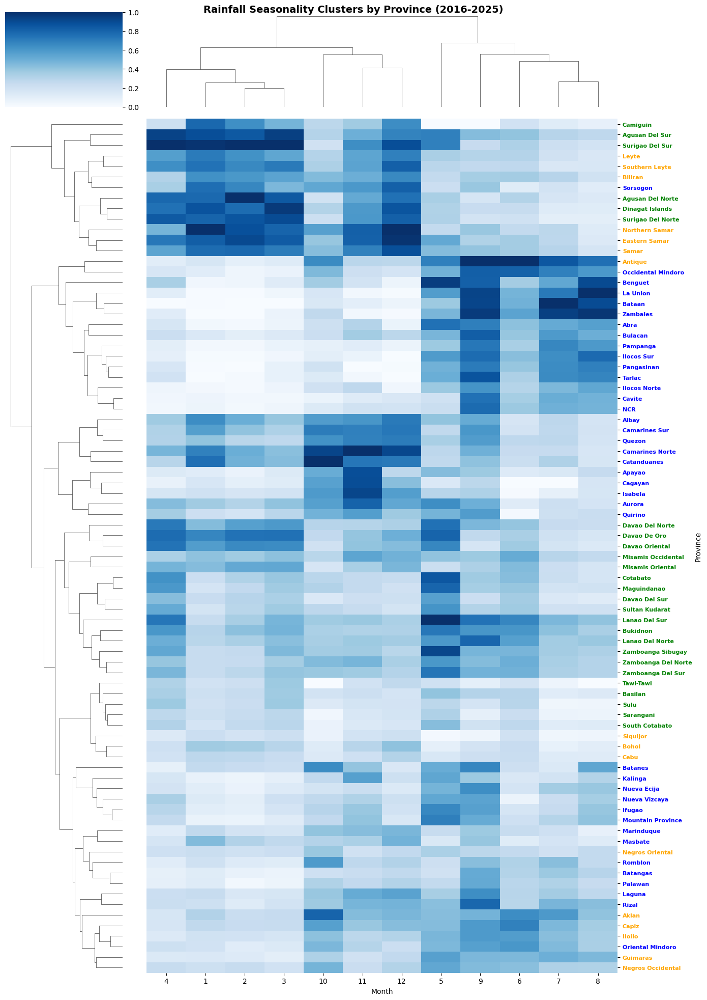

In [42]:
rainfall_matrix = (rainfall[rainfall["Year"] >= 2016].groupby(["Province", "Month"])["rfh"].mean().unstack().fillna(0))
    
dendro = sns.clustermap(rainfall_matrix, cmap="Blues", figsize=(14, 20), standard_scale=1, dendrogram_ratio=(0.2, 0.1))
for label in dendro.ax_heatmap.get_yticklabels():
    province = label.get_text()
    label.set_color(region_colors.get(assign_region(province), "black"))
    label.set_fontweight("bold")
    label.set_fontsize(8)    
dendro.fig.suptitle("Rainfall Seasonality Clusters by Province (2016-2025)", fontsize=14, weight="bold")
dendro.fig.subplots_adjust(top=0.95)
dendro.fig.tight_layout()

**The previous analysis led me to examine the rainfall anomaly values to understand their potential influence on the seasonality patterns observed earlier. To standardize the comparison across provinces, I computed the standard deviation of the anomaly values over the past 10 years, creating what I refer to as the "Rainfall Volatility Index". The resulting values were sorted afterward.**

**Interestingly, no clear spatial groupings emerged from the volatility rankings. All provinces exhibited annual fluctuations above 30%, likely spread across different months. Provinces within the same major island group did not consistently cluster together. However, a couple of noteworthy observations: all but one province in the Visayas showed volatility levels above 40%, while nearly 60% of all Mindanao provinces had less than 40% annual fluctuation, including the nine provinces with the lowest volatility overall. These suggest that Mindanao, in general, tends to experience more stable annual rainfall patterns, whereas the Visayas may be more susceptible to year-to-year variability.**

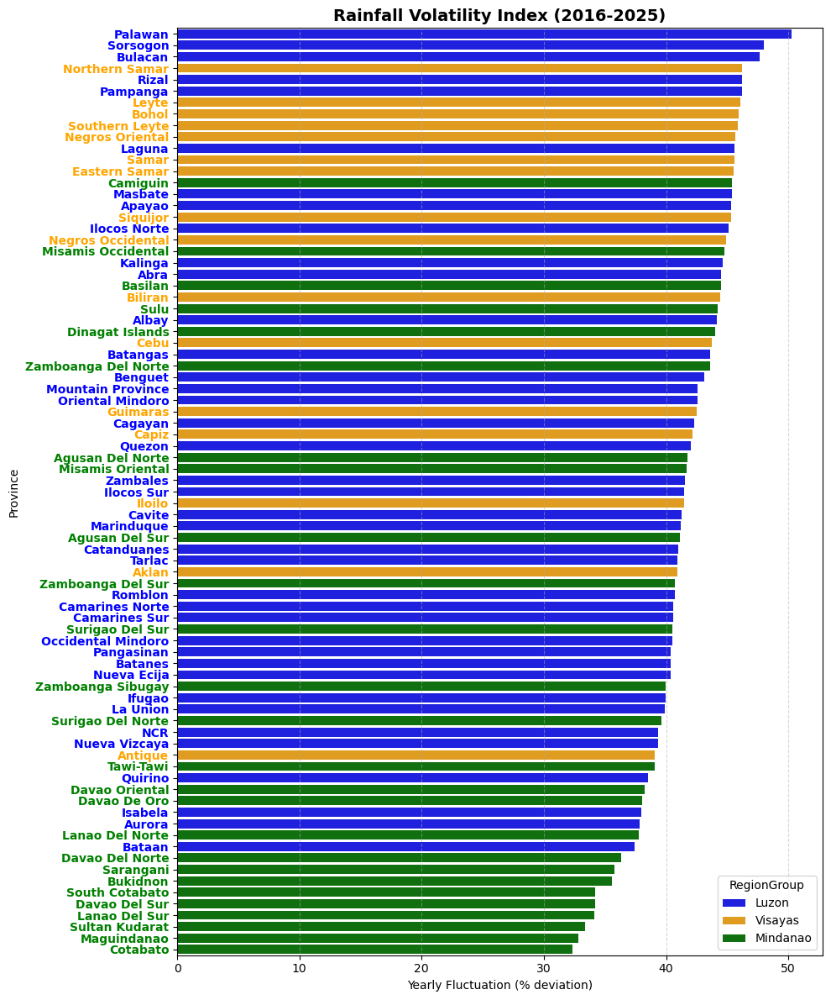

In [44]:
anomaly_volatility = (rainfall[rainfall["Year"] >= 2016].groupby(["Province", "RegionGroup"])["r1q"].std().reset_index()
                      .rename(columns={"r1q": "Volatility"}).sort_values("Volatility", ascending=False))

plt.figure(figsize=(10, 12))
barplot = sns.barplot(data=anomaly_volatility, y="Province", x="Volatility", hue="RegionGroup", palette=region_colors)
tick_labels = barplot.get_yticklabels()
province_to_region = dict(zip(anomaly_volatility["Province"], anomaly_volatility["RegionGroup"]))
for label in tick_labels:
    province = label.get_text()
    region = province_to_region.get(province, "Unknown")
    label.set_color(region_colors.get(region, "black"))
    label.set_weight("bold")
plt.title("Rainfall Volatility Index (2016-2025)", fontsize=14, weight="bold")
plt.xlabel("Yearly Fluctuation (% deviation)")
plt.ylabel("Province")
plt.grid(axis="x", linestyle="--", alpha=0.5)
plt.tight_layout()
plt.show()

**Up to this point, we have established two distinct seasons in terms of rainfall intensity. Over the last 10 years, however, identifying predictable rainfall totals, or even consistent ranges, for a particular province throughout the year has proven difficult, much more for over 80 of them. Hence, I went to explore the peak rainfall months, defined as the singular month with the highest total rainfall in a given year, over the last 10 years. To better visualize the distribution and variation of these peak months, I combined a box plot and strip plot into one chart.**

**The resulting chart was a pleasant balance of color and rich information. As expected, the typical monsoon months of July to October frequently appeared as peak months, especially for most of the Luzon provinces. Since only one peak month per year is included in the analysis, the appearance of different monsoon months for the same province reinforces the intra-seasonal variability inferred earlier. For Mindanao, peak months were generally more scattered and less seasonally concentrated.**

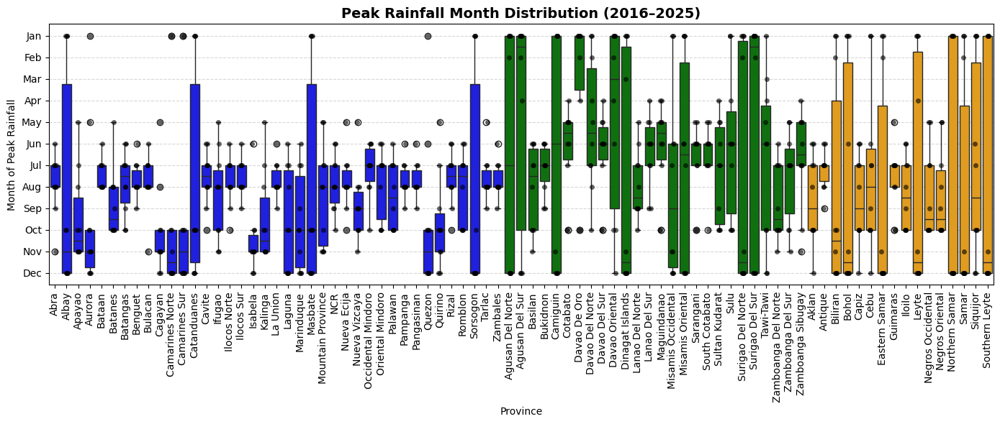

In [46]:
peak_months = (rainfall[rainfall["Year"] >= 2016].groupby(["Province", "Year"])
               .apply(lambda df: df.loc[df["rfh"].idxmax(), ["Month", "rfh"]], include_groups=False).reset_index()
               .rename(columns={"Month": "PeakMonth", "rfh": "PeakRainfall"}))
peak_months["PeakMonth"] = peak_months["PeakMonth"].apply(lambda x: calendar.month_abbr[int(x)])
month_order = list(calendar.month_abbr)[1:]
peak_months["PeakMonth"] = pd.Categorical(peak_months["PeakMonth"], categories=month_order, ordered=True)
peak_months = peak_months.merge(rainfall[["Province", "RegionGroup"]].drop_duplicates(), on="Province", how="left")

province_order = (peak_months[["Province", "RegionGroup"]].drop_duplicates().sort_values(by=["RegionGroup", "Province"])["Province"].tolist())
peak_months["Province"] = pd.Categorical(peak_months["Province"], categories=province_order, ordered=True)

region_order = (peak_months.drop_duplicates("Province").set_index("Province").loc[province_order]["RegionGroup"].tolist())
palette = [region_colors.get(rg, "black") for rg in region_order]

plt.figure(figsize=(14, 6))
sns.boxplot(data=peak_months, x="Province", y="PeakMonth", hue="Province",palette=palette)
sns.stripplot(data=peak_months, x="Province", y="PeakMonth", color="black", alpha=0.6)
plt.title("Peak Rainfall Month Distribution (2016–2025)", fontsize=14, weight="bold")
plt.ylabel("Month of Peak Rainfall")
plt.xlabel("Province")
plt.grid(axis="y", linestyle="--", alpha=0.5)
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

**However, upon longer inspection, we can notice one striking peculiarity: several southern provinces displayed a box plot covering 11 or even all 12 months, despite the data spanning only 10 years. This anomaly suggests that the calendar structure itself may be influencing the statistical treatment. Specifically, when the monsoon season extends into December or even the following January, different years may record these months as distinct peak periods. Since each calendar year was treated as one discrete unit, this resulted in an artificially wide interquartile range, giving the impression that rainfall peaks were distributed across the entire year. To address this, I simply shifted the calendar to reflect April as the "start" of the year, marking the transition into the monsoon season. This resulted to a more impactful and meaningful representation of peak rainfall patterns across provinces. This allowed me to observe the following trends:**
- **Provinces in and around the geographical plains of Luzon (La Union, Bataan, Bulacan, Pampanga, Pangasinan, Tarlac, Nueva Ecija, Zambales) normally peak in July to August, coinciding with the typical onset of the monsoon season.**
- **The highland regions (Kalinga, Apayao, Mountain Province, Ifugao, Nueva Vizcaya) and island provinces (Palawan, Mindoro provinces, Catanduances, Masbate, Marinduque, Romblon) interestingly exhibited similar broad peak rainfall windows spanning 4 or more months throughout the year. This is probably due to exposure to diverse weather systems experienced by both mountainous areas as well as islands.**
- **The Bicol region, comprised of provinces facing the Pacific, is shown to experience peak rainfall later during the monsoon season, generally from October to January, likely influenced by the Northeast Monsoon.**
- **Provinces within the Visayas island group exhibits a fairly consistent peak rainfall period of July to January. The Western and Central Visayas provinces peak with the start of the monsoon season (July to October) while the Eastern Visayas provinces peak at the tail-end (November to January).**
- **The Mindanao island group showed the most prominent variability in peak rainfall distribution, i.e. some provinces showed peaks of May to July while some had December to January. Even adjacent provinces such as Davao Del Norte and Davao Del Sur have completely different peak month profiles.**
- **The easternmost edge of the country, consisting of provinces from all major island groups such as Albay, Sorsogon, Samar provinces, Leyte provinces, Dinagat Islands, Agusan provinces, and Surigao provinces, along with the islands of Bohol and Camiguin, have a narrow rainfall peak period of around December and January.**

In [48]:
peak_months.query("Province == 'Agusan Del Norte'")

,Province,Year,PeakMonth,PeakRainfall,RegionGroup
10,Agusan Del Norte,2016,Dec,496.3506,Mindanao
11,Agusan Del Norte,2017,Jan,854.7114,Mindanao
12,Agusan Del Norte,2018,Jan,631.3093,Mindanao
13,Agusan Del Norte,2019,Jan,499.7939,Mindanao
14,Agusan Del Norte,2020,Dec,597.6907,Mindanao
15,Agusan Del Norte,2021,Dec,857.1340,Mindanao
16,Agusan Del Norte,2022,Dec,784.6185,Mindanao
17,Agusan Del Norte,2023,Jan,808.0825,Mindanao
18,Agusan Del Norte,2024,Dec,450.1546,Mindanao
19,Agusan Del Norte,2025,Feb,567.5155,Mindanao


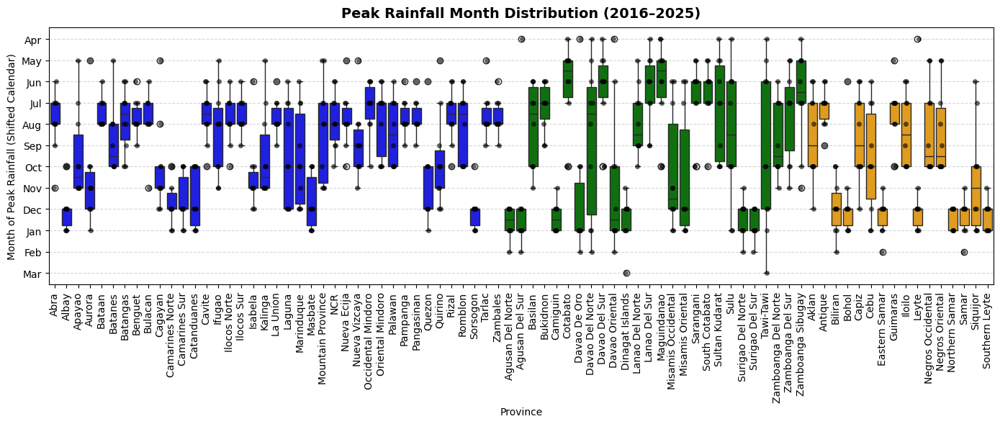

In [49]:
peak_months = (rainfall[rainfall["Year"] >= 2016].groupby(["Province", "Year"])
               .apply(lambda df: pd.Series({"PeakMonth":df.loc[df["rfh"].idxmax(), "Month"],
                                            "PeakRainfall":df.loc[df["rfh"].idxmax(), "rfh"]}), include_groups=False).reset_index())
month_shift = {4:1, 5:2, 6:3, 7:4, 8:5, 9:6, 10:7, 11:8, 12:9, 1:10, 2:11, 3:12}
peak_months["ShiftedMonth"] = peak_months["PeakMonth"].map(month_shift)
month_labels = ["Apr", "May", "Jun", "Jul", "Aug", "Sep", "Oct", "Nov", "Dec", "Jan", "Feb", "Mar"]
peak_months = peak_months.merge(rainfall[["Province", "RegionGroup"]].drop_duplicates(), on="Province", how="left")

province_order = (peak_months[["Province", "RegionGroup"]].drop_duplicates().sort_values(by=["RegionGroup", "Province"])["Province"].tolist())
peak_months["Province"] = pd.Categorical(peak_months["Province"], categories=province_order, ordered=True)

region_order = (peak_months.drop_duplicates("Province").set_index("Province").loc[province_order]["RegionGroup"].tolist())
palette = [region_colors.get(rg, "black") for rg in region_order]

plt.figure(figsize=(14, 6))
sns.boxplot(data=peak_months, x="Province", y="ShiftedMonth", hue="Province", palette=palette)
sns.stripplot(data=peak_months, x="Province", y="ShiftedMonth", color="black", alpha=0.6)
plt.yticks(ticks=range(1, 13), labels=month_labels)
plt.title("Peak Rainfall Month Distribution (2016–2025)", fontsize=14, weight="bold", pad=10)
plt.ylabel("Month of Peak Rainfall (Shifted Calendar)")
plt.xlabel("Province")
plt.grid(axis="y", linestyle="--", alpha=0.5)
plt.xticks(rotation=90)
plt.gca().invert_yaxis() 
plt.tight_layout()
plt.show()